In [2]:
!pip install datasets -q


In [5]:

from sklearn.manifold import TSNE

import torch

from transformers import Wav2Vec2Model
import torchaudio


import librosa

from datasets import load_from_disk

import numpy as np
import pandas as pd
from scipy.stats import zscore
from librosa.sequence import dtw as lib_dtw
from datasets import load_dataset


In [4]:
# prompt: login in hugginface

from huggingface_hub import notebook_login

notebook_login()


In [6]:
dataset = load_dataset("juanfengyun/CAAP")

In [7]:
dataset

DatasetDict({
    train: Dataset({
        features: ['Filename', 'filePath', 'Speaker', 'DisorderOrNot', 'Gender', 'Years', 'TextId'],
        num_rows: 789
    })
})

In [8]:
ds = dataset['train']
ds

Dataset({
    features: ['Filename', 'filePath', 'Speaker', 'DisorderOrNot', 'Gender', 'Years', 'TextId'],
    num_rows: 789
})

In [9]:
# prompt: create a wav_paths[] to save all files from ds, the wavpath is '/content/drive/MyDrive/Colab Notebooks/CAAP/audios/' + ds['filePath']['path']

wav_paths = []
for i in range(len(ds)):
  wav_paths.append('CAAP_2023-04-27/wavs/audios/' + ds[i]['filePath']['path'])


In [10]:
wav_paths

['CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP01.wav',
 'CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP02.wav',
 'CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP03.wav',
 'CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP04.wav',
 'CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP05.wav',
 'CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP07.wav',
 'CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP08.wav',
 'CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP09.wav',
 'CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP10.wav',
 'CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP11.wav',
 'CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP12.wav',
 'CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP13.wav',
 'CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP15.wav',
 'CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP16.wav',
 'CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP17.wav',
 'CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP18.wav',
 'CAAP_2023-04-27/wavs/a

In [11]:
seed = 31415
time_frame = 5

expected_sr = 16000

In [21]:
time_frame=5
def time_txt(time, time_frame=5):
    if time % time_frame == 0:
        return f"{round(time * 0.02, 2)}"
    return ""

def create_df(feats, speaker_len, names,textId):
    cols = [f"val {i}" for i in range(feats.shape[1])]
    df = pd.DataFrame(feats, columns=cols)
    df['idx'] = df.index
    time_index = {i: speaker_len[i] for i in range(len(speaker_len))}
    com_time_index = {i: sum(speaker_len[:i]) for i in range(len(speaker_len))}
    df_speaker_count = pd.Series(time_index)
    df_speaker_count = df_speaker_count.reindex(df_speaker_count.index.repeat(df_speaker_count.to_numpy())).rename_axis(
        'speaker_id').reset_index()
    df['speaker_id'] = df_speaker_count['speaker_id']
    df['speaker_len'] = df['speaker_id'].apply(lambda row: speaker_len[row])
    df['com_sum'] = df['speaker_id'].apply(lambda i: com_time_index[i])
    df['speaker'] = df['speaker_id'].apply(lambda i: names[i])
    df['textId'] = df['speaker_id'].apply(lambda i: int(textId[i]))
    df['time'] = df['idx'] - df['com_sum']
    df['time_txt'] = df[['time', 'speaker_len']].apply(lambda row: time_txt(row['time'], time_frame), axis=1)
    assert len(df.loc[df['speaker'] == -1]) == 0
    assert len(df_speaker_count) == len(df)
    df_subset = df.copy()
    data_subset = df_subset[cols].values
    return data_subset, df_subset, cols

In [22]:
wavs = []
for wav_path in wav_paths:
    print(wav_path)
    wav, sr = torchaudio.load(wav_path)
    if sr != expected_sr:
        print(f"Sampling rate of {wav_path} is not {expected_sr} -> Resampling the file")
        resampler = torchaudio.transforms.Resample(orig_freq=sr, new_freq=expected_sr)
        wav = resampler(wav)
        wav.squeeze()
    wavs.append(wav)

device_name = "cuda" if torch.cuda.is_available() else "cpu"
device = torch.device(device_name)
print(f'Running on {device_name}')


layer = 22
# print("Layer: ", layer)
names = [f.split('-')[1][:2] for f in ds['Filename']]
textId = [f.rsplit('.', 1)[0][-2:] for f in ds['Filename']]

print("Speaker names: ", names)

dfs = []
# for layer in range(25):
print("Layer: ", layer)
model = Wav2Vec2Model.from_pretrained("facebook/wav2vec2-large")
features = None
speaker_len = []
for wav in wavs:
  wav_features = model(wav, return_dict=True, output_hidden_states=True).hidden_states[layer].squeeze().detach().numpy()
  features = wav_features if features is None else np.concatenate([features, wav_features], axis=0)
  speaker_len.append(wav_features.shape[0])
num_features_per_frame = features.shape[1]
data_subset, df_subset, hubert_feature_columns = create_df(features, speaker_len, names,textId)
dfs.append(df_subset)

CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP01.wav
Sampling rate of CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP01.wav is not 16000 -> Resampling the file
CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP02.wav
Sampling rate of CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP02.wav is not 16000 -> Resampling the file
CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP03.wav
Sampling rate of CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP03.wav is not 16000 -> Resampling the file
CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP04.wav
Sampling rate of CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP04.wav is not 16000 -> Resampling the file
CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP05.wav
Sampling rate of CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP05.wav is not 16000 -> Resampling the file
CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP07.wav
Sampling rate of CAAP_2023-04-27/wavs/audios/2AU201-01DM4_9SSD-CAAP07.wav is not 16000 -> Resampling the fil

F:\Anaconda\lib\site-packages\huggingface_hub\file_download.py:1150: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
F:\Anaconda\lib\site-packages\torch\nn\utils\weight_norm.py:28: UserWarning: torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.
  warnings.warn("torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.")
Some weights of the model checkpoint at facebook/wav2vec2-large were not used when initializing Wav2Vec2Model: ['project_q.weight', 'project_q.bias', 'quantizer.weight_proj.bias', 'project_hid.weight', 'quantizer.codevectors', 'quantizer.weight_proj.weight', 'project_hid.bias']
- This IS expected if you are initializing Wav2Vec2Model from the checkpoint of a model trained on another task or with another architecture (e.g. initiali

In [23]:
dfs

[          val 0     val 1     val 2     val 3     val 4     val 5     val 6  \
 0      0.199389  0.264064  0.215595 -0.013378 -0.245468 -0.426013  0.425822   
 1      0.176695  0.229195  0.296068 -0.087467 -0.257474 -0.406058  0.408901   
 2      0.173714  0.202586  0.266536 -0.152239 -0.231485 -0.433735  0.384006   
 3      0.179806  0.255713  0.175335 -0.068494 -0.183540 -0.425730  0.368701   
 4      0.274273  0.188502  0.080344  0.039442 -0.220313 -0.115075  0.243275   
 ...         ...       ...       ...       ...       ...       ...       ...   
 41161  0.046534  0.310175  0.184012  0.055587 -0.113829 -0.418453  0.274081   
 41162  0.060943  0.300729  0.200007 -0.004068 -0.154021 -0.464019  0.284669   
 41163  0.077496  0.279191  0.183697 -0.054153 -0.121919 -0.451258  0.271446   
 41164  0.078727  0.287259  0.157874 -0.081965 -0.112859 -0.419159  0.263971   
 41165  0.124372  0.308735  0.051052  0.004279 -0.065883 -0.318786  0.222678   
 
           val 7     val 8     val 9  

In [24]:
Refs_Files_df = pd.read_csv("ref_files_and_layers.csv")
Refs_Files_df

,Word_ID,Ref_File,Layer
0,1,2AU201-18NM4_0-CAAP01.wav,23
1,2,2AU201-10NF4_5-CAAP02.wav,23
2,3,2AU201-18NM4_0-CAAP03.wav,23
3,4,2AU201-40NF4_8-CAAP04.wav,23
4,5,2AU201-13DM3_4SSD-CAAP05.wav,23
5,6,2AU201-18NM4_0-CAAP06.wav,23
6,7,2AU201-18NM4_0-CAAP07.wav,23
7,8,2AU201-15DF4_1SSD-CAAP08.wav,23
8,9,2AU201-10NF4_5-CAAP09.wav,23
9,10,2AU201-10NF4_5-CAAP10.wav,23


In [25]:

tsne_1 = 'tsne-3d-one'
tsne_2 = 'tsne-3d-two'
tsne_3 = 'tsne-3d-thr'

time_frame=5
def mut_normalize_sequences(sq1, sq2, normalize: bool):
    if normalize:
        sq1 = np.array(sq1)
        sq2 = np.array(sq2)
        len_sq1 = sq1.shape[0]

        arr = np.concatenate((sq1, sq2), axis=0)
        for dim in range(sq1.shape[1]):
            arr[:, dim] = zscore(arr[:, dim])
        sq1 = arr[:len_sq1, :]
        sq2 = arr[len_sq1:, :]
    return sq1, sq2


def time_txt(time, time_frame=5):
    if time % time_frame == 0:
        return f"{round(time * 0.02, 2)}"
    return ""


def librosa_dtw(sq1, sq2):
    return lib_dtw(sq1.transpose(), sq2.transpose())[0][-1, -1]


def calc_distance(df_subset, speaker1, speaker2, cols):
    # Extract features for the two speakers
    features_speaker1 = df_subset[df_subset['speaker'] == speaker1][cols].to_numpy()
    features_speaker2 = df_subset[df_subset['speaker'] == speaker2][cols].to_numpy()

    # Debugging: Print feature shapes
    print(f"Features for speaker {speaker1}: {features_speaker1.shape}")
    print(f"Features for speaker {speaker2}: {features_speaker2.shape}")

    # Check if features are empty
    if features_speaker1.size == 0 or features_speaker2.size == 0:
        print(f"Skipping distance calculation: Empty features for speaker {speaker1} or {speaker2}")
        return -1  # Return a default value or handle as needed

    # Normalize and calculate distance
    features_speaker1, features_speaker2 = mut_normalize_sequences(features_speaker1, features_speaker2, True)
    distance = librosa_dtw(features_speaker1, features_speaker2)
    distance = distance / (len(features_speaker1) + len(features_speaker2))
    return distance



def tsne(data_subset, init='pca', early_exaggeration=12.0, lr='auto', n_comp=3, perplexity=40, iters=1000,
         random_state=None):
    tsne = TSNE(n_components=n_comp, verbose=1, perplexity=perplexity, n_iter=iters, init=init,
                early_exaggeration=early_exaggeration,
                learning_rate=lr, random_state=random_state)
    tsne_results = tsne.fit_transform(data_subset)
    return tsne_results


def fill_tsne(df_subset, tsne_results):
    print(tsne_results[:, 0].shape)
    df_subset[tsne_1] = tsne_results[:, 0]
    df_subset[tsne_2] = tsne_results[:, 1]
    if tsne_results.shape[1] == 3:
        df_subset[tsne_3] = tsne_results[:, 2]
    return df_subset


In [28]:
dfs[0]

,val 0,val 1,val 2,val 3,val 4,val 5,val 6,val 7,val 8,val 9,...,val 1022,val 1023,idx,speaker_id,speaker_len,com_sum,speaker,textId,time,time_txt
0,0.199389,0.264064,0.215595,-0.013378,-0.245468,-0.426013,0.425822,-0.037452,-0.267912,-0.274802,...,0.027549,-0.084570,0,0,42,0,01,1,0,0.0
1,0.176695,0.229195,0.296068,-0.087467,-0.257474,-0.406058,0.408901,-0.105406,-0.258417,-0.275824,...,0.079123,-0.154890,1,0,42,0,01,1,1,
2,0.173714,0.202586,0.266536,-0.152239,-0.231485,-0.433735,0.384006,-0.122565,-0.304288,-0.314938,...,0.072369,-0.129798,2,0,42,0,01,1,2,
3,0.179806,0.255713,0.175335,-0.068494,-0.183540,-0.425730,0.368701,-0.087468,-0.271982,-0.236526,...,0.019460,-0.037027,3,0,42,0,01,1,3,
4,0.274273,0.188502,0.080344,0.039442,-0.220313,-0.115075,0.243275,-0.000406,-0.178323,-0.246379,...,0.068826,-0.071225,4,0,42,0,01,1,4,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41161,0.046534,0.310175,0.184012,0.055587,-0.113829,-0.418453,0.274081,-0.037248,-0.270277,-0.066916,...,-0.075540,-0.033810,41161,788,77,41089,40,46,72,
41162,0.060943,0.300729,0.200007,-0.004068,-0.154021,-0.464019,0.284669,-0.034916,-0.300760,-0.127814,...,0.011783,-0.058672,41162,788,77,41089,40,46,73,
41163,0.077496,0.279191,0.183697,-0.054153,-0.121919,-0.451258,0.271446,-0.023599,-0.320786,-0.162979,...,0.031521,-0.065116,41163,788,77,41089,40,46,74,
41164,0.078727,0.287259,0.157874,-0.081965,-0.112859,-0.419159,0.263971,-0.020704,-0.344438,-0.207178,...,0.023092,-0.060223,41164,788,77,41089,40,46,75,1.5


In [48]:
Refs = ['01','06','10','13','18','26','27','31','36','40']

In [49]:
import numpy as np

# Extract the 'Speaker' column from the dataset and convert it to a NumPy array
speakers = ds['Speaker']
speakers_array = np.array(speakers)

# Print the NumPy array
print(speakers_array)

['01' '02' '06' '07' '09' '10' '13' '15' '18' '26' '27' '28' '31' '32'
 '36' '40']


In [45]:
# Convert speakers to an integer list
speakers_int = [int(speaker) for speaker in speakers]

# Convert Refs to an integer list
Refs_int = [int(ref) for ref in Refs]

# Print the converted lists
print("Speakers as integers:", speakers_int)
print("Refs as integers:", Refs_int)

Speakers as integers: [1, 2, 6, 7, 9, 10, 13, 15, 18, 26, 27, 28, 31, 32, 36, 40]
Refs as integers: [1, 6, 10, 13, 18, 26, 27, 31, 36, 40]


In [ ]:
for speaker in speakers_int:
    for ref in Refs_int:
        S1 = speaker
        S2 = ref
        print( f"Speaker 1: {S1}, Speaker 2: {S2}")

In [37]:
print(f"Number of DataFrames in dfs: {len(dfs)}")
assert len(dfs) > 0, "The dfs list is empty. Ensure the processing loop is working correctly."

Number of DataFrames in dfs: 25


In [50]:
S1 = '01'
S2 = '06'
print( f"Speaker 1: {S1}, Speaker 2: {S2}")

Fulldistance = calc_distance(df_subset, S1, S2, hubert_feature_columns)
print(f"Full Dim. Distance: {Fulldistance}")

cols = [tsne_1, tsne_2, tsne_3]
TSNEdistance = calc_distance(df_subset, S1, S2, cols)
print(f"TSNE Dim. Distance: {TSNEdistance}")

Speaker 1: 01, Speaker 2: 06
Features for speaker 01: (42, 1024)
Features for speaker 06: (37, 1024)
Full Dim. Distance: 16.376253346755565
Features for speaker 01: (42, 3)
Features for speaker 06: (37, 3)
TSNE Dim. Distance: 0.5689566151688209


In [29]:
df_subsets = []
for i in range(len(dfs)):
    print(f"Layer DataFrame {i}:")
    # print(dfs[i])# Filter numeric columns from the DataFrame
    df_subset_orig = dfs[i].copy()

    numeric_cols = df_subset_orig.select_dtypes(include=[np.number])

    # Ensure there are no missing values
    numeric_cols = numeric_cols.dropna()

    # Convert the filtered DataFrame to a NumPy array
    data_subset = numeric_cols.to_numpy()

    # Pass the numeric data to the TSNE function
    tsne_results = tsne(data_subset, init='pca', early_exaggeration=2.0, lr=100.0, n_comp=3, perplexity=40, iters=1000, random_state=seed)

    # Fill the TSNE results back into the original DataFrame
    df_subset = fill_tsne(df_subset_orig, tsne_results)
    df_subsets.append(df_subset)

Layer DataFrame 0:
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 41166 samples in 0.051s...
[t-SNE] Computed neighbors for 41166 samples in 36.555s...
[t-SNE] Computed conditional probabilities for sample 1000 / 41166
[t-SNE] Computed conditional probabilities for sample 2000 / 41166
[t-SNE] Computed conditional probabilities for sample 3000 / 41166
[t-SNE] Computed conditional probabilities for sample 4000 / 41166
[t-SNE] Computed conditional probabilities for sample 5000 / 41166
[t-SNE] Computed conditional probabilities for sample 6000 / 41166
[t-SNE] Computed conditional probabilities for sample 7000 / 41166
[t-SNE] Computed conditional probabilities for sample 8000 / 41166
[t-SNE] Computed conditional probabilities for sample 9000 / 41166
[t-SNE] Computed conditional probabilities for sample 10000 / 41166
[t-SNE] Computed conditional probabilities for sample 11000 / 41166
[t-SNE] Computed conditional probabilities for sample 12000 / 41166
[t-SNE] Computed conditional 

F:\Anaconda\lib\site-packages\sklearn\manifold\_t_sne.py:982: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


[t-SNE] KL divergence after 250 iterations with early exaggeration: 3.651884


KeyboardInterrupt: 

In [76]:
df_subsets,len(df_subsets)

([        val 0     val 1     val 2     val 3     val 4     val 5     val 6  \
  0   -0.353702 -0.473683  0.383246  0.110029 -0.596121 -0.263642 -0.102629   
  1   -0.362942 -0.490715  0.509490  0.174005 -0.558822 -0.287867 -0.070537   
  2   -0.366314 -0.492724  0.491862  0.272124 -0.539573 -0.287224 -0.098011   
  3   -0.365884 -0.488560  0.484313  0.400123 -0.543085 -0.189654 -0.137361   
  4    0.379035 -0.612904  0.254673  0.192953 -0.479769  0.151397  0.008139   
  ..        ...       ...       ...       ...       ...       ...       ...   
  700  0.165492 -1.056366  0.104022  0.880455 -0.794018  0.486557 -0.091476   
  701  0.192375 -1.052322  0.114339  0.922415 -0.808567  0.464208 -0.094443   
  702  0.211009 -1.043386  0.112772  0.972930 -0.845446  0.436106 -0.093476   
  703  0.202063 -1.036572  0.141612  1.045336 -0.880598  0.506024 -0.110227   
  704  0.600222 -0.887208  0.207255  0.491204 -0.580144  1.300675  0.062144   
  
          val 7     val 8     val 9  ...  idx  sp

In [78]:
for i in range(len(df_subsets)):
    print(f"Layer DataFrame {i}:")
    # print(dfs[i])
    distances = []
    assert len(dfs[i]) > 0, f"DataFrame {i} is empty. Ensure the processing loop is working correctly."
    for speaker in speakers:
        for ref in Refs:


            if str(speaker) == str(ref):  # Cast both to strings for comparison
                continue

            df_subset_orig = df_subsets[i].copy()
            # data_subset_orig = data_subset.copy()
            print(df_subset_orig)
            # tsne_results = tsne(df_subset_orig, init='pca', early_exaggeration=2.0, lr=100.0, n_comp=3, perplexity=40, iters=1000,random_state=seed)
            # df_subset = fill_tsne(df_subset_orig, tsne_results)
            # print(df_subset)
            # breakpoint()
            S1 = speaker
            S2 = ref
            print( f"Speaker 1: {S1}, Speaker 2: {S2}")

            Fulldistance = calc_distance(df_subset_orig, S1, S2, hubert_feature_columns)
            print(f"Full Dim. Distance: {Fulldistance}")

            cols = [tsne_1, tsne_2, tsne_3]
            TSNEdistance = calc_distance(df_subset_orig, S1, S2, cols)
            print(f"TSNE Dim. Distance: {TSNEdistance}")
            # return Fulldistance, TSNEdistance
            distances.append({
                'speaker1': speaker,
                'speaker2': ref,
                'TextId1': "01",
                'TextId2': "01",
                'Full_distance': Fulldistance,
                "TSNE_distance": TSNEdistance
            })
        # breakpoint();

    # Convert the distances list to a DataFrame
    distances_df = pd.DataFrame(distances)

    # Save the DataFrame to a CSV file
    # distances_df.to_csv('distances.csv', index=False)

    # Print the DataFrame
    # print(distances_df)

    distances_df.to_csv(f'csv/W2V2_Distances_01_{i}.csv', index=False)
    print(f"Distances for layer {i} saved to W2V2_Distances_01_{i}.csv.")

Layer DataFrame 0:
        val 0     val 1     val 2     val 3     val 4     val 5     val 6  \
0   -0.353702 -0.473683  0.383246  0.110029 -0.596121 -0.263642 -0.102629   
1   -0.362942 -0.490715  0.509490  0.174005 -0.558822 -0.287867 -0.070537   
2   -0.366314 -0.492724  0.491862  0.272124 -0.539573 -0.287224 -0.098011   
3   -0.365884 -0.488560  0.484313  0.400123 -0.543085 -0.189654 -0.137361   
4    0.379035 -0.612904  0.254673  0.192953 -0.479769  0.151397  0.008139   
..        ...       ...       ...       ...       ...       ...       ...   
700  0.165492 -1.056366  0.104022  0.880455 -0.794018  0.486557 -0.091476   
701  0.192375 -1.052322  0.114339  0.922415 -0.808567  0.464208 -0.094443   
702  0.211009 -1.043386  0.112772  0.972930 -0.845446  0.436106 -0.093476   
703  0.202063 -1.036572  0.141612  1.045336 -0.880598  0.506024 -0.110227   
704  0.600222 -0.887208  0.207255  0.491204 -0.580144  1.300675  0.062144   

        val 7     val 8     val 9  ...  idx  speaker_id 

In [52]:
distances_df

,speaker1,speaker2,TextId1,TextId2,Full_distance,TSNE_distance
0,01,06,01,01,16.376253,0.568957
1,01,10,01,01,19.713559,1.225768
2,01,13,01,01,22.912362,1.196181
3,01,18,01,01,17.356871,0.971324
4,01,26,01,01,22.631721,1.291410
...,...,...,...,...,...,...
145,40,18,01,01,21.994249,1.378896
146,40,26,01,01,22.132208,1.269312
147,40,27,01,01,17.948981,0.654971
148,40,31,01,01,22.133949,1.270847


In [55]:
def load_and_clean_csv(file_path):
    df = pd.read_csv(file_path)
    return df.loc[:, ~df.columns.str.contains('^Unnamed')]

file_path = "APTCT_distance_01.csv"
APTCT_Distance_df = load_and_clean_csv(file_path)
APTCT_Distance_df

,Files,speech_status,age,gender,word,word_phonemes,recording_phonemes,speaker_id,word_id,Distance
0,2AU201-01DM4_9SSD-CAAP01.wav,1,57,0,duck,dahk,dahk,1,1,0
1,2AU201-02NF6_8-CAAP01.wav,0,80,1,duck,dahk,dah,2,1,1
2,2AU201-06NF6_0-CAAP01.wav,0,72,1,duck,dahk,dahk,6,1,0
3,2AU201-07DM3_0SSD-CAAP01.wav,1,36,0,duck,dahk,ahmaydaach,7,1,8
4,2AU201-09DF4_0SSD-CAAP01.wav,1,48,1,duck,dahk,dah,9,1,1
5,2AU201-10NF4_5-CAAP01.wav,0,53,1,duck,dahk,dahk,10,1,0
6,2AU201-13DM3_4SSD-CAAP01.wav,1,40,0,duck,dahk,dahk,13,1,0
7,2AU201-15DF4_1SSD-CAAP01.wav,1,49,1,duck,dahk,gehk,15,1,2
8,2AU201-18NM4_0-CAAP01.wav,0,48,0,duck,dahk,dahk,18,1,0
9,2AU201-26NF3_11-CAAP01.wav,0,47,1,duck,dahk,dahk,26,1,0


In [56]:
def calculate_average_distance_by_speaker(df, speaker_column):
    return df.groupby(speaker_column).mean()


In [ ]:
from scipy.stats import pearsonr  # Import for Pearson correlation

def calculate_pearson_correlation(df1,df2, col1, col2):
    """
    Calculate the Pearson correlation between two columns in a DataFrame.
    """
    correlation, _ = pearsonr(df1[col1], df2[col2])
    return correlation


In [86]:
from scipy.stats import pearsonr

correlations =[]
pvalues = []
for i in range(25):
    W2V2_Distance_df = load_and_clean_csv(f'csv/W2V2_Distances_01_{i}.csv')
    print(f"Loaded W2V2_Distances_01_{i}.csv")
    W2V2_avg_distance_by_speaker = calculate_average_distance_by_speaker(W2V2_Distance_df, 'speaker1')
    print("Average distance by speaker1 for W2V2_Distance_df:")
    print(W2V2_avg_distance_by_speaker)
    # Ensure the columns 'TSNE_distance' and 'distance' exist in the DataFrame
    if 'TSNE_distance' in W2V2_avg_distance_by_speaker.columns and 'Distance' in APTCT_Distance_df.columns:
        correlation,pvalue= pearsonr(W2V2_avg_distance_by_speaker['TSNE_distance'], APTCT_Distance_df['Distance'])
        print(f"Pearson correlation between TSNE_distance and distance: {correlation}")
    else:
        print("Columns 'TSNE_distance' and/or 'distance' are missing in APTCT_Distance_df.")

    correlations.append(correlation)
    pvalues.append(pvalue)

# Create a DataFrame to store correlations and p-values
correlation_data = pd.DataFrame({
    'Layer': list(range(25)),
    'Correlation': correlations,
    'P-value': pvalues
})

# Save the DataFrame to a CSV file for further analysis
correlation_data.to_csv('csv/Correlation_Pvalues.csv', index=False)
print("Correlation and p-values saved to csv/Correlation_Pvalues.csv")

# Display the DataFrame
correlation_data

Loaded W2V2_Distances_01_0.csv
Average distance by speaker1 for W2V2_Distance_df:
           speaker2  TextId1  TextId2  Full_distance  TSNE_distance
speaker1                                                           
1         23.000000      1.0      1.0      21.729768       1.421587
2         20.800000      1.0      1.0      22.813595       1.412376
6         22.444444      1.0      1.0      20.124849       1.450331
7         20.800000      1.0      1.0      25.853749       1.643157
9         20.800000      1.0      1.0      22.144559       1.420752
10        22.000000      1.0      1.0      22.949542       1.472658
13        21.666667      1.0      1.0      20.543576       1.405857
15        20.800000      1.0      1.0      24.916587       1.554046
18        21.111111      1.0      1.0      21.132107       1.484575
26        20.222222      1.0      1.0      21.387559       1.454261
27        20.111111      1.0      1.0      21.055618       1.408165
28        20.800000      1.0      

,Layer,Correlation,P-value
0,0,0.678544,0.003856
1,1,0.589287,0.016300
2,2,0.584621,0.017385
3,3,0.717768,0.001743
4,4,0.648065,0.006629
5,5,0.635903,0.008102
6,6,0.620330,0.010354
7,7,0.603239,0.013366
8,8,0.674992,0.004120
9,9,0.730776,0.001302


In [80]:
correlations, pvalues

([0.6785438199952788,
  0.589287230002822,
  0.5846206655239555,
  0.7177678675595088,
  0.6480650340696432,
  0.6359032482769267,
  0.6203301987193429,
  0.6032386870024552,
  0.6749923145960629,
  0.7307762280030582,
  0.6030273035427255,
  0.6620985515195174,
  0.6340695544569455,
  0.7009181105957498,
  0.6742318928166658,
  0.6536207829702609,
  0.6350671660270906,
  0.689747727428294,
  0.7420757840691178,
  0.6822090485992942,
  0.5876222753707726,
  0.6015456938714316,
  0.745126573367404,
  0.6783218162428007,
  0.6240254599933605],
 [0.0038558391800151367,
  0.016299749301790133,
  0.01738532508334761,
  0.0017429298935808357,
  0.006628968837225645,
  0.008101987811525328,
  0.010354471413949299,
  0.013366228156004372,
  0.004119854438266183,
  0.0013015909484658653,
  0.013407344427620033,
  0.005202956363238364,
  0.008344944229088382,
  0.0024880740524325724,
  0.004178226540799949,
  0.00603134006443474,
  0.008212059725214719,
  0.0031107254464116706,
  0.0009965721766

In [3]:
import pandas as pd

correlation_data = pd.read_csv("csv/Correlation_Pvalues_2.csv")
correlation_data

,Layer,Correlation,P-value
0,0,0.678544,0.003856
1,1,0.589287,0.016300
2,2,0.584621,0.017385
3,3,0.717768,0.001743
4,4,0.648065,0.006629
5,5,0.635903,0.008102
6,6,0.620330,0.010354
7,7,0.603239,0.013366
8,8,0.674992,0.004120
9,9,0.730776,0.001302


In [4]:
correlations = correlation_data['Correlation'].tolist()
pvalues = correlation_data['P-value'].tolist()

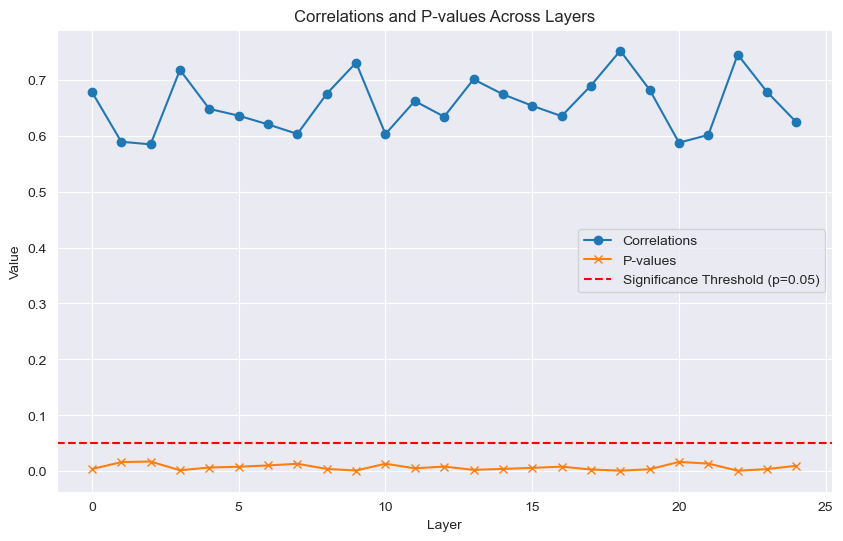

In [5]:
import matplotlib.pyplot as plt

# Generate a chart for correlations and p-values
layers = list(range(25))  # Assuming 25 layers
plt.figure(figsize=(10, 6))

# Plot correlations
plt.plot(layers, correlations, label='Correlations', marker='o')

# Plot p-values
plt.plot(layers, pvalues, label='P-values', marker='x')

# Add labels, title, and legend
plt.xlabel('Layer')
plt.ylabel('Value')
plt.title('Correlations and P-values Across Layers')
plt.axhline(y=0.05, color='r', linestyle='--', label='Significance Threshold (p=0.05)')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()


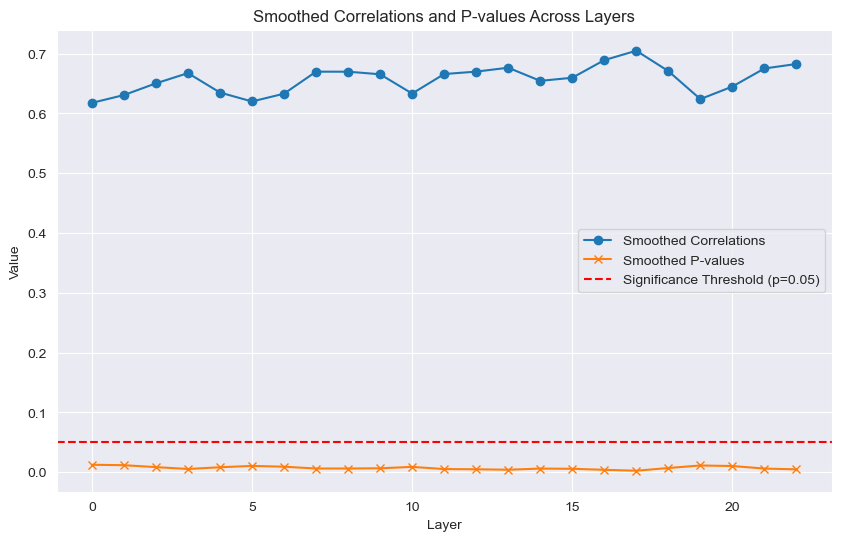

In [87]:
import numpy as np
import matplotlib.pyplot as plt

# Define a moving average function
def moving_average(data, window_size):
    return np.convolve(data, np.ones(window_size) / window_size, mode='valid')

# Smooth the correlations and p-values using a moving average
window_size = 3  # Adjust the window size for more or less smoothing
smoothed_correlations = moving_average(correlations, window_size)
smoothed_pvalues = moving_average(pvalues, window_size)

# Adjust the layers to match the smoothed data
smoothed_layers = list(range(len(smoothed_correlations)))

# Generate a chart for smoothed correlations and p-values
plt.figure(figsize=(10, 6))

# Plot smoothed correlations
plt.plot(smoothed_layers, smoothed_correlations, label='Smoothed Correlations', marker='o')

# Plot smoothed p-values
plt.plot(smoothed_layers, smoothed_pvalues, label='Smoothed P-values', marker='x')

# Add labels, title, and legend
plt.xlabel('Layer')
plt.ylabel('Value')
plt.title('Smoothed Correlations and P-values Across Layers')
plt.axhline(y=0.05, color='r', linestyle='--', label='Significance Threshold (p=0.05)')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()


Best correlation: 0.752075784 at layer 18


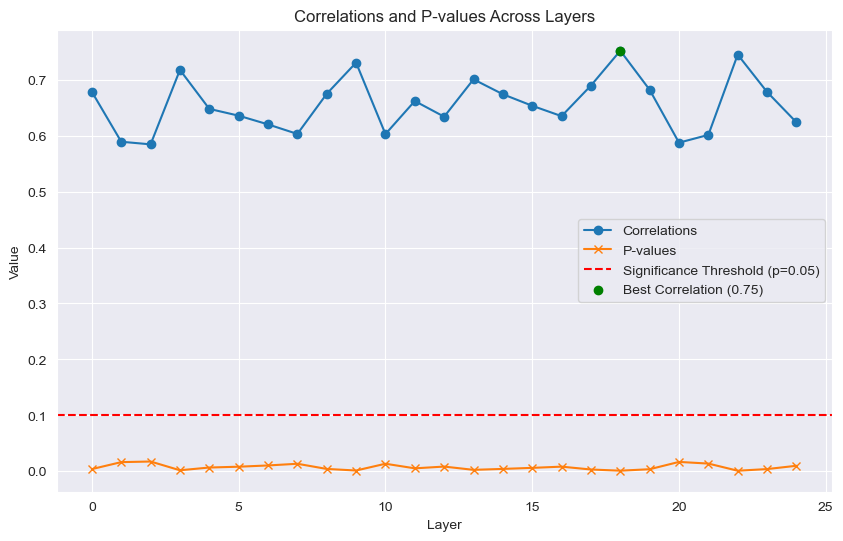

In [6]:
# Find the best correlation and its corresponding layer
max_correlation = max(correlations)
best_layer = correlations.index(max_correlation)

print(f"Best correlation: {max_correlation} at layer {best_layer}")

# Highlight the best correlation on the chart
plt.figure(figsize=(10, 6))
plt.plot(layers, correlations, label='Correlations', marker='o')
plt.plot(layers, pvalues, label='P-values', marker='x')
plt.axhline(y=0.1, color='r', linestyle='--', label='Significance Threshold (p=0.05)')
plt.scatter(best_layer, max_correlation, color='green', label=f'Best Correlation ({max_correlation:.2f})', zorder=5)

# Add labels, title, and legend
plt.xlabel('Layer')
plt.ylabel('Value')
plt.title('Correlations and P-values Across Layers')
plt.legend()
plt.grid(True)
plt.show()
